In [1]:
import os

os.chdir('..')

import tqdm

import numpy as np
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

# Get rid of the deprecation warnings
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

import matplotlib.pyplot as plt
import matplotlib as mpl

#from tensorflow.python.lib.io import tf_record
#from tensorflow.core.util import event_pb2
#from tensorflow.python.framework import tensor_util

from models.models import DeepStatisticalSolver

Instructions for updating:
non-resource variables are not supported in the long term


This notebook considers the AC Power Flow problem on two possible datasets.

The current notebook is composed of the following parts:
- Reload a trained model
- Compute the important metrics (same as the ones displayed in the paper)
- Visualize the evolution of the loss, latent variables and actual prediction

By default, the notebook was made for the power grid IEEE case14, but if you want to switch to case118,
just change the `model_path` and `data_dir` variables

# Reloading a model

In [2]:
# Enter path to model. Three pre-trained models are available : best_linear_0, best_linear_1, best_linear_2
model_path = "results/proxy_acpf_118_2" # "results/best_acpf_118_0" change for case118

# Enter path to data to build architecture
data_dir = 'datasets/acpf_118' # "datasets/acpf_118" change for case118

# Initialize a tensorflow session
sess = tf.Session()

# Build the Deep Statistical Solver
model = DeepStatisticalSolver(sess, 
                          model_to_restore=model_path, 
                          default_data_directory=data_dir)

In [3]:
# Load the test set (change the mode variable if you want val or train)
mode = 'test'

# Import numpy data
A_np = np.load(os.path.join(data_dir, 'A_'+mode+'.npy'))
B_np = np.load(os.path.join(data_dir, 'B_'+mode+'.npy'))
U_np = np.load(os.path.join(data_dir, 'U_'+mode+'.npy'))
coord_np = np.load(os.path.join(data_dir, 'coord_'+mode+'.npy'))

# Computing metrics

In [5]:
# We need this short method to compute the flows based on the voltage angle and magnitude
def compute_flows(A, B, Vm, Va):
    
    A_offset = A \
        + np.shape(B)[1] \
        * np.reshape(np.arange(np.shape(A)[0]), [-1, 1, 1]) \
        * np.array([[[1., 1., 0., 0.]]])
    
    i_from = A_offset[:, :, 0].astype(np.int32)
    i_to = A_offset[:, :, 1].astype(np.int32)
    A1 = A_offset[:, :, 2]
    A2 = A_offset[:, :, 3]

    V_i = Vm[i_from]#, 0]
    V_j = Vm[i_to]#, 0]

    theta_i = Va[i_from]#, 1]
    theta_j = Va[i_to]#, 1]

    P_ij = A1 * V_i * V_j * np.cos(theta_i - theta_j - A2)

    Q_ij = A1 * V_i * V_j * np.sin(theta_i - theta_j - A2)
    
    return P_ij, Q_ij

In [6]:
# For the whole dataset, we will compute both the individual loss of each sample, 
# and the final predictions
costs_DSS = None
costs_NR = None

Vm_DSSs = None
Va_DSSs = None
Vm_NRs = None
Va_NRs = None

P_ij_DSSs = None
Q_ij_DSSs = None
P_ij_NRs = None
Q_ij_NRs = None

# In order to split the dataset, define the size of the batches that will be fed to the model.
# For very large dataset, it can be useful to have a small value for BATCH_SIZE
BATCH_SIZE = 100

# Get total amount of samples and split the dataset
n_samples_tot = A_np.shape[0]
n_batches = n_samples_tot // BATCH_SIZE
batched_indices = np.array_split(np.arange(n_samples_tot), n_batches) 

# Iterate over the batches
for indices in tqdm.tqdm(batched_indices):
    
    U_DSS, cost_DSS = sess.run([model.U_final, model.cost_per_sample[str(model.correction_updates)]], 
             feed_dict = {model.A:A_np[indices], model.B:B_np[indices]}
            )
    
    cost_NR = sess.run(model.cost_per_sample[str(model.correction_updates)], 
             feed_dict = {model.A:A_np[indices], model.B:B_np[indices], model.U_final:U_np[indices]}
            )
        
    # Getting predicted Vm
    Vm_DSS = U_DSS[:, :, 0]
    Vm_DSS = np.reshape(Vm_DSS, -1)

    # Getting predicted Va
    Va_DSS = U_DSS[:, :, 1]
    Va_DSS = Va_DSS - Va_DSS[:, 0:1]
    Va_DSS = np.reshape(Va_DSS, -1)

    # Getting actual Vm
    Vm_NR = U_np[indices, :, 0]
    Vm_NR = np.reshape(Vm_NR, -1)

    # Getting actual Va
    Va_NR = U_np[indices, :, 1]
    Va_NR = Va_NR - Va_NR[:, 0:1]
    Va_NR = np.reshape(Va_NR, -1)

    # Correcting disconnected nodes
    Va_DSS = Va_DSS * (Va_NR !=0.)
    
    P_ij_DSS, Q_ij_DSS = compute_flows(A_np[indices], 
                                         B_np[indices], 
                                         Vm_DSS, Va_DSS)
    P_ij_NR, Q_ij_NR = compute_flows(A_np[indices], 
                                     B_np[indices], 
                                     Vm_NR, Va_NR)
    P_ij_DSS = np.reshape(P_ij_DSS, -1)
    Q_ij_DSS = np.reshape(Q_ij_DSS, -1)
    P_ij_NR = np.reshape(P_ij_NR, -1)
    Q_ij_NR = np.reshape(Q_ij_NR, -1)


    if costs_DSS is None:
        costs_DSS = cost_DSS
        costs_NR = cost_NR
        Vm_DSSs = Vm_DSS
        Va_DSSs = Va_DSS
        Vm_NRs = Vm_NR
        Va_NRs = Va_NR
        P_ij_DSSs = P_ij_DSS
        Q_ij_DSSs = Q_ij_DSS
        P_ij_NRs = P_ij_NR
        Q_ij_NRs = Q_ij_NR
        
    else:
        costs_DSS = np.concatenate([costs_DSS, cost_DSS])
        costs_NR = np.concatenate([costs_NR, cost_NR])
        Vm_DSSs = np.concatenate([Vm_DSSs, Vm_DSS])
        Va_DSSs = np.concatenate([Va_DSSs, Va_DSS])
        Vm_NRs = np.concatenate([Vm_NRs, Vm_NR])
        Va_NRs = np.concatenate([Va_NRs, Va_NR])
        P_ij_DSSs = np.concatenate([P_ij_DSSs, P_ij_DSS])
        Q_ij_DSSs = np.concatenate([Q_ij_DSSs, Q_ij_DSS])
        P_ij_NRs = np.concatenate([P_ij_NRs, P_ij_NR])
        Q_ij_NRs = np.concatenate([Q_ij_NRs, Q_ij_NR])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:18<00:00,  1.26it/s]


In [6]:
print('Loss - GNS')
print('    10th percentile = {}'.format(np.percentile(costs_DSS, 10)))
print('    50th percentile = {}'.format(np.percentile(costs_DSS, 50)))
print('    90th percentile = {}'.format(np.percentile(costs_DSS, 90)))
print('Loss - NR')
print('(Keep in mind that the maximum precision achieved by tf.float32 is around 1e-14')
print('Thus the loss computed by tensorflow is noisy)')
print('    10th percentile = {}'.format(np.percentile(costs_NR, 10)))
print('    50th percentile = {}'.format(np.percentile(costs_NR, 50)))
print('    90th percentile = {}'.format(np.percentile(costs_NR, 90)))
print('Correlation between methods')
print('    Correlation Vm = {}'.format(np.corrcoef(Vm_DSSs,Vm_NRs)[1,0]))
print('    Correlation Va = {}'.format(np.corrcoef(Va_DSSs,Va_NRs)[1,0]))
print('    Correlation Pij = {}'.format(np.corrcoef(P_ij_DSSs,P_ij_NRs)[1,0]))
print('    Correlation Qij = {}'.format(np.corrcoef(Q_ij_DSSs,Q_ij_NRs)[1,0]))
print('RMSE between methods')
print('    RMSE Vm = {}'.format(np.sqrt(np.mean((Vm_DSSs-Vm_NRs)**2))))
print('    RMSE Va = {}'.format(np.sqrt(np.mean((Va_DSSs-Va_NRs)**2))))
print('    RMSE Pij = {}'.format(np.sqrt(np.mean((P_ij_DSSs-P_ij_NRs)**2))))
print('    RMSE Qij = {}'.format(np.sqrt(np.mean((Q_ij_DSSs-Q_ij_NRs)**2))))
print('normalized RMSE between methods')
print('    normalized RMSE Vm = {}'.format(np.sqrt(np.mean((Vm_DSSs-Vm_NRs)**2))\
      /(np.max(Vm_NRs)-np.min(Vm_NRs))))
print('    normalized RMSE Va = {}'.format(np.sqrt(np.mean((Va_DSSs-Va_NRs)**2))\
      /(np.max(Va_NRs)-np.min(Va_NRs))))
print('    normalized RMSE Pij = {}'.format(np.sqrt(np.mean((P_ij_DSSs-P_ij_NRs)**2))\
      /(np.max(P_ij_NRs)-np.min(P_ij_NRs))))
print('    normalized RMSE Qij = {}'.format(np.sqrt(np.mean((Q_ij_DSSs-Q_ij_NRs)**2))\
      /(np.max(Q_ij_NRs)-np.min(Q_ij_NRs))))
print('MAE between methods')
print('    MAE Vm = {}'.format(np.mean(np.abs(Vm_DSSs-Vm_NRs))))
print('    MAE Va = {}'.format(np.mean(np.abs(Va_DSSs-Va_NRs))))
print('    MAE Pij = {}'.format(np.mean(np.abs(P_ij_DSSs-P_ij_NRs))))
print('    MAE Qij = {}'.format(np.mean(np.abs(Q_ij_DSSs-Q_ij_NRs))))
print('normalized MAE between methods')
print('    normalized MAE Vm = {}'.format(np.mean(np.abs(Vm_DSSs-Vm_NRs))\
      /(np.max(Vm_NRs)-np.min(Vm_NRs))))
print('    normalized MAE Va = {}'.format(np.mean(np.abs(Va_DSSs-Va_NRs))\
      /(np.max(Va_NRs)-np.min(Va_NRs))))
print('    normalized MAE Pij = {}'.format(np.mean(np.abs(P_ij_DSSs-P_ij_NRs))\
      /(np.max(P_ij_NRs)-np.min(P_ij_NRs))))
print('    normalized MAE Qij = {}'.format(np.mean(np.abs(Q_ij_DSSs-Q_ij_NRs))\
      /(np.max(Q_ij_NRs)-np.min(Q_ij_NRs))))

Loss - GNS
    10th percentile = 2.987748189298145e-06
    50th percentile = 5.340996494851424e-06
    90th percentile = 1.3830853094987116e-05
Loss - NR
(Keep in mind that the maximum precision achieved by tf.float32 is around 1e-14
Thus the loss computed by tensorflow is noisy)
    10th percentile = 2.940311534559755e-14
    50th percentile = 4.2255449830895346e-14
    90th percentile = 6.389503319883044e-14
Correlation between methods
    Correlation Vm = 0.9996297229039509
    Correlation Va = 0.9991106251909275
    Correlation Pij = 0.9999941539762784
    Correlation Qij = 0.9999995487351763
RMSE between methods
    RMSE Vm = 0.000730516244323687
    RMSE Va = 0.009255597179736164
    RMSE Pij = 3.7577473806386648
    RMSE Qij = 5.254621720223753
normalized RMSE between methods
    normalized RMSE Vm = 0.0006608530234703178
    normalized RMSE Va = 0.005957044003803066
    normalized RMSE Pij = 0.0003850527619430562
    normalized RMSE Qij = 7.314058596403189e-05
MAE between metho

In [7]:
P_ij_NR.shape

(47600,)

Depending on whether we are using case14 or case118, the correlations of our prediction with the output of a Newton-Raphson method should vary a bit.

However, the correlation for the active and reactive power flows (i.e. Pij and Qij) should be above 99.99%

# Visualize loss, H and U

In [8]:
# Let's pick a random sample
sample = np.random.randint(0,A_np.shape[0])

# Predict and gather latent variables, intermediate predictions and the loss
feed_dict = {model.A:A_np[sample:sample+1], model.B:B_np[sample:sample+1]}
H_list, U_list, loss_list = sess.run([model.H, model.U, model.loss], feed_dict = feed_dict)

In [9]:
# Convert those dictionaries into actual np array
U = np.array([u[0,:,:] for u in U_list.values()])
H = np.array([h[0,:,:] for h in H_list.values()])
loss = np.array([l for l in loss_list.values()])

## Loss visualization

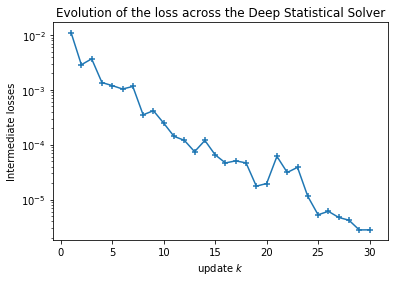

In [10]:
# Plotting the loss
plt.plot(np.arange(1,loss.shape[0]+1),loss)
plt.scatter(np.arange(1,loss.shape[0]+1), loss, marker='+')
plt.yscale('log')
plt.ylabel('Intermediate losses')
plt.xlabel(r'update $k$')
plt.title('Evolution of the loss across the Deep Statistical Solver')
plt.show()

The loss decreases by several orders of magnitude between the first prediction and the last

## Structure of the graph

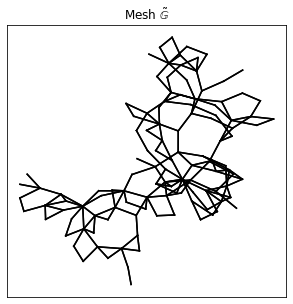

In [11]:
edges_or = A_np[sample, :, 0].astype(np.int32)
edges_ex = A_np[sample, :, 1].astype(np.int32)

# Creating mesh coordinates
coordinates = coord_np[0]
coordinates_or_x = coordinates[edges_or, 0]
coordinates_or_y = coordinates[edges_or, 1]
coordinates_ex_x = coordinates[edges_ex, 0]
coordinates_ex_y = coordinates[edges_ex, 1]

coordinates_edge_x = np.c_[coordinates_or_x, coordinates_ex_x]
coordinates_edge_y = np.c_[coordinates_or_y, coordinates_ex_y]

plt.figure(figsize=[5,5])
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelleft=False) # labels along the bottom edge are off

plt.plot(coordinates_edge_x.T, coordinates_edge_y.T, 'k', zorder=1)
plt.title(r'Mesh $\tilde{\mathbb{G}}$')
plt.show()



This is the undirected and unweighted graph that bears the structure of the problem instance.


## Intermediate predictions of Voltage module

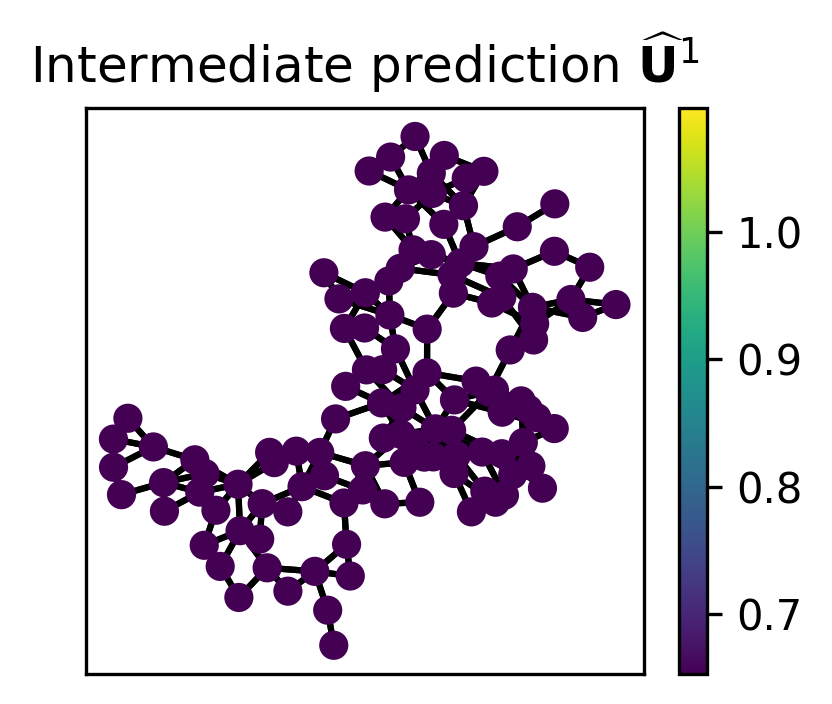

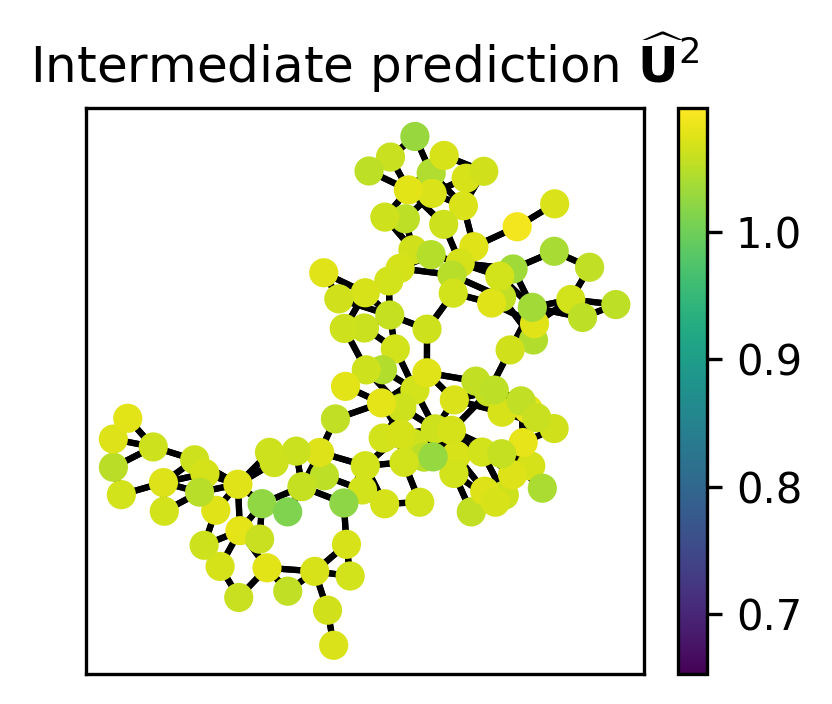

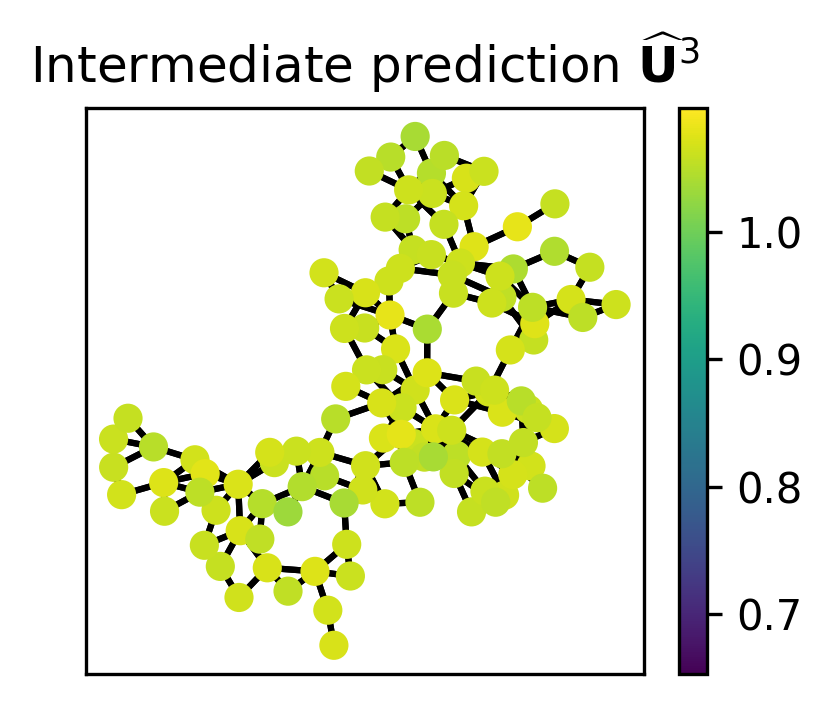

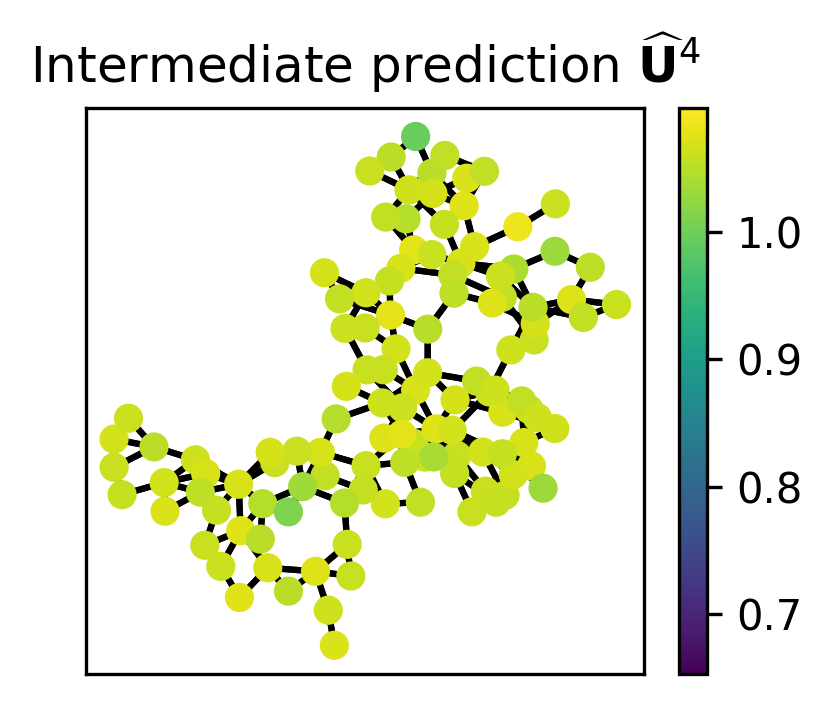

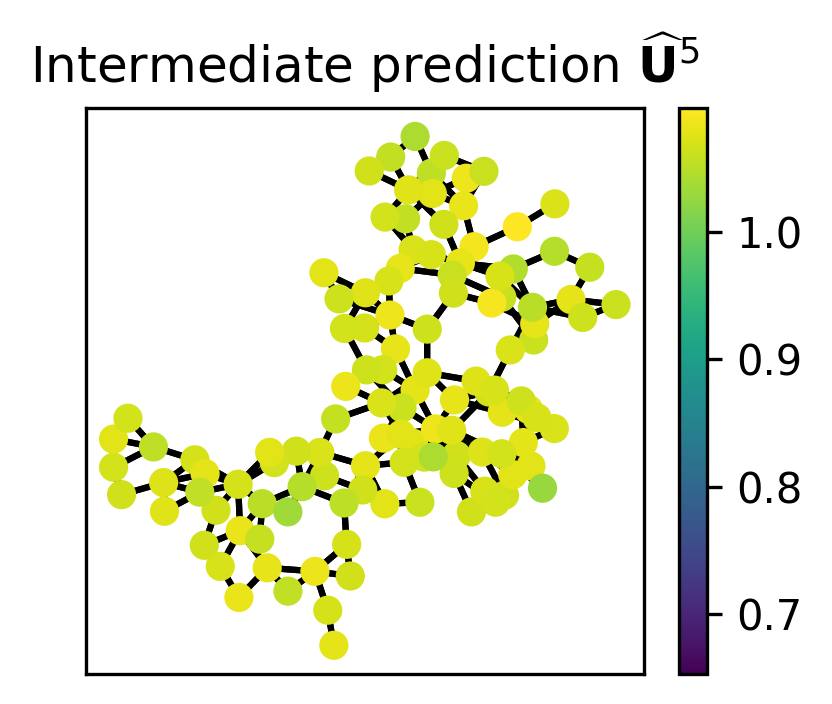

...

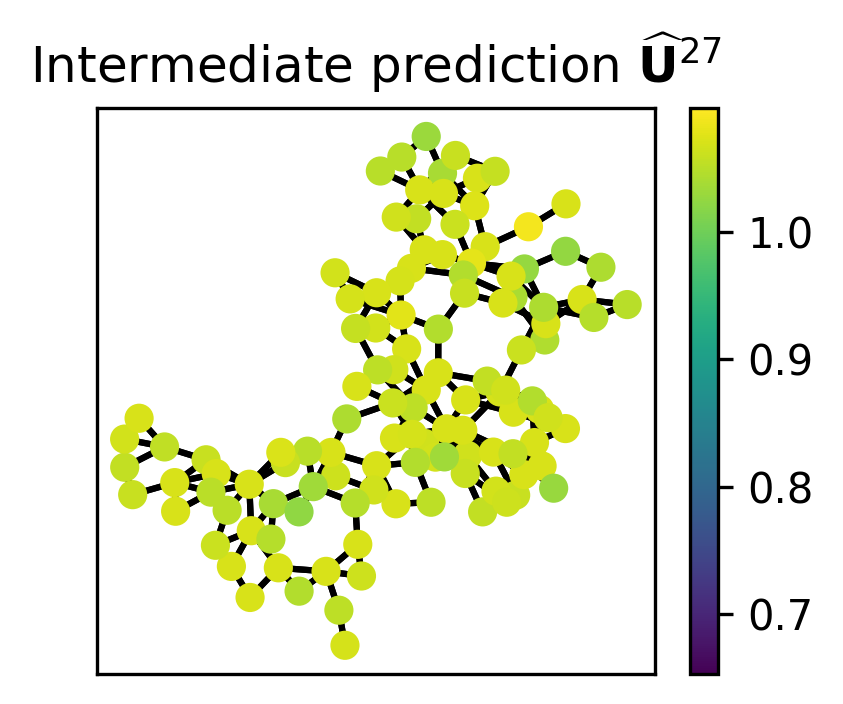

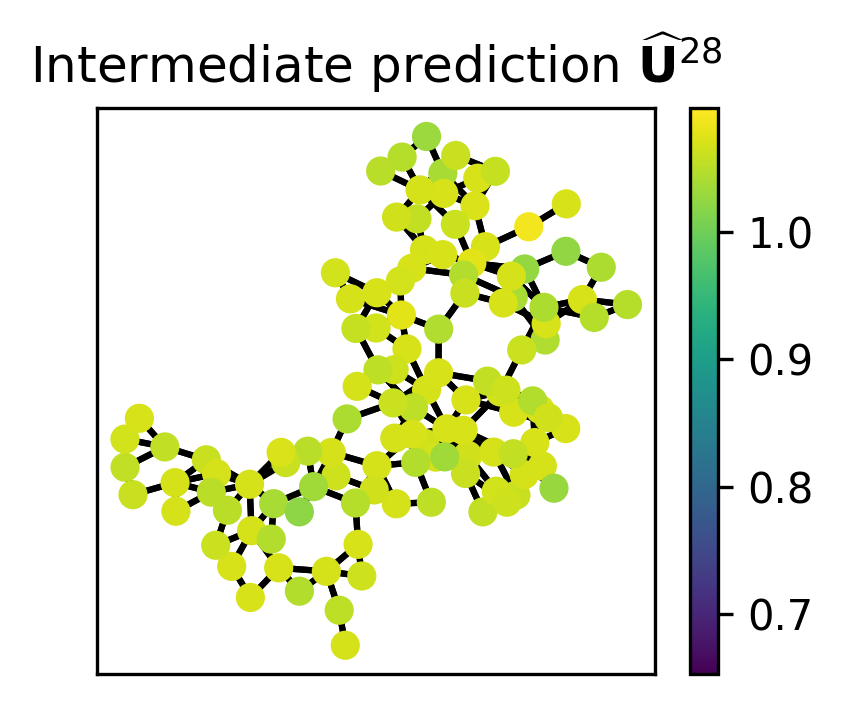

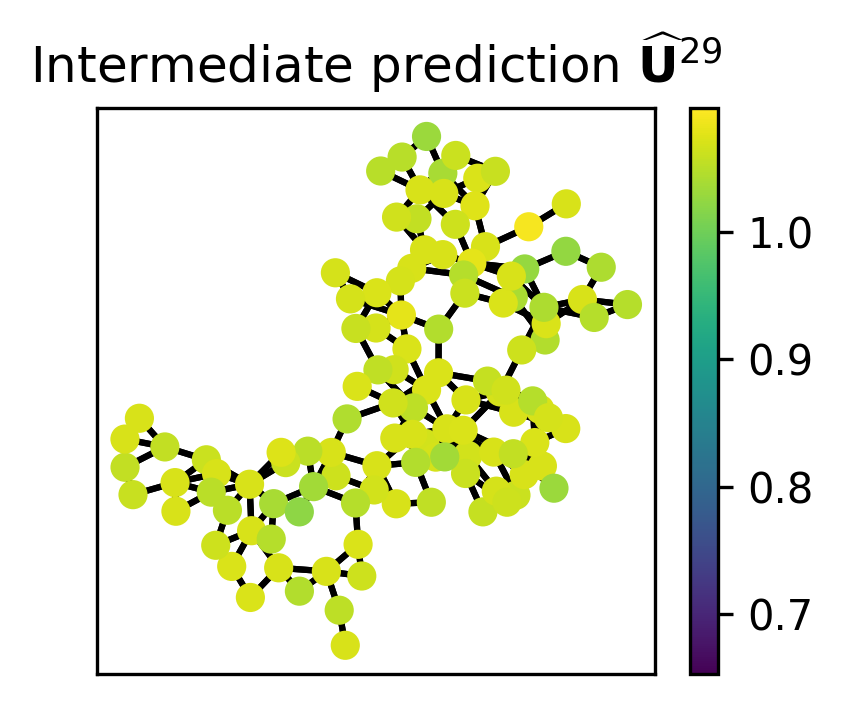

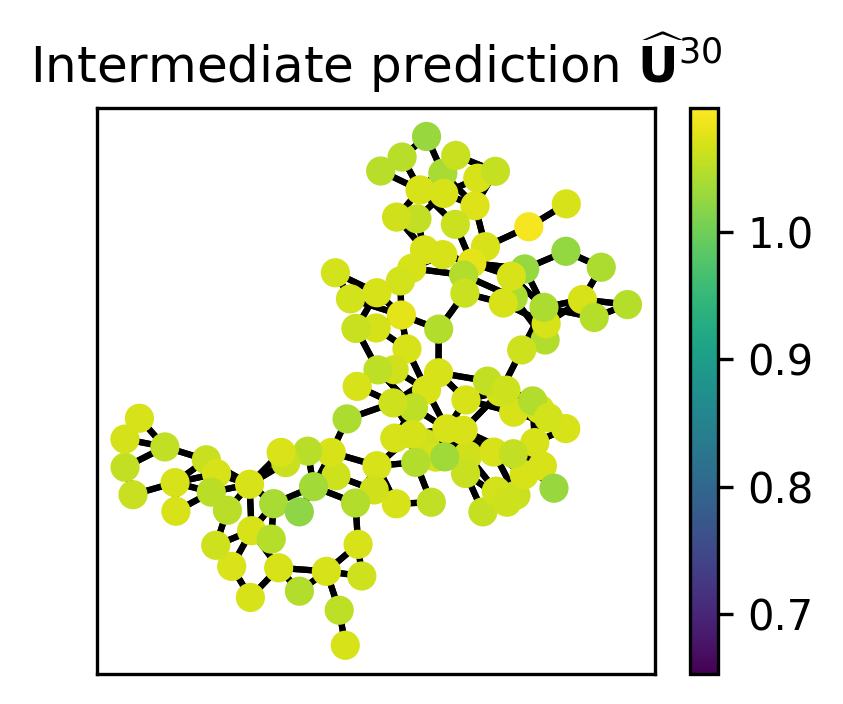

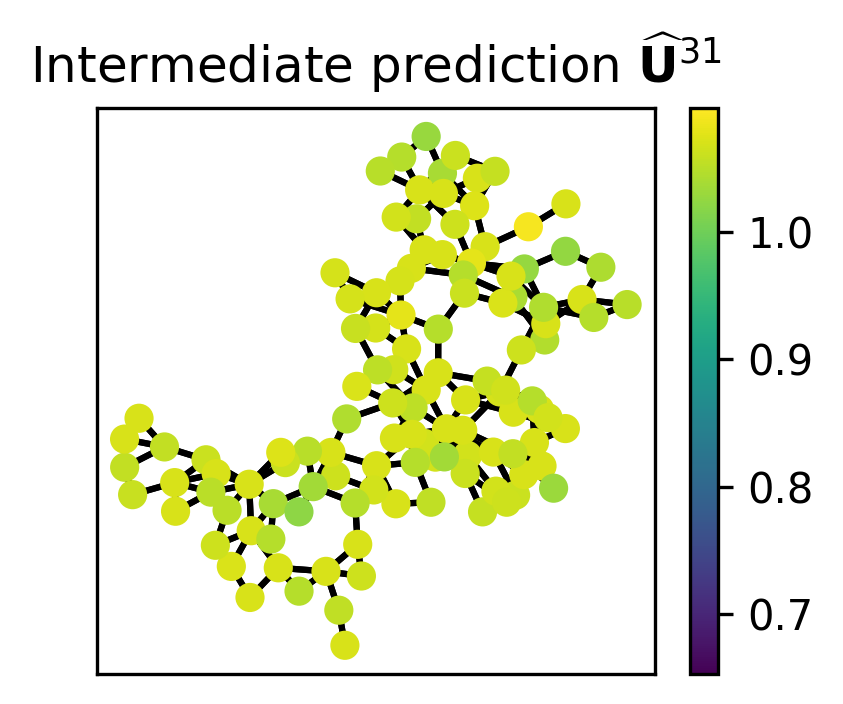

In [12]:
max_x = np.max(U[:,:, 0])
min_x = np.min(U[:,:, 0])

for frame in range(U.shape[0]):
    plt.figure(figsize=[3,2.5], dpi=300)
    
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.tick_params(
        axis='y',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelleft=False) # labels along the bottom edge are off
    plt.plot(coordinates_edge_x.T, coordinates_edge_y.T, 'k', zorder=1)
    plt.scatter(coordinates[:,0], coordinates[:,1], c=U[frame,:, 0], zorder=2)
    plt.clim(min_x, max_x)
    plt.colorbar()
    plt.title(r'Intermediate prediction $\widehat{\mathbf{U}}^{'+str(frame+1)+'}$')
    plt.show()

## Intermediate predictions of Voltage angle

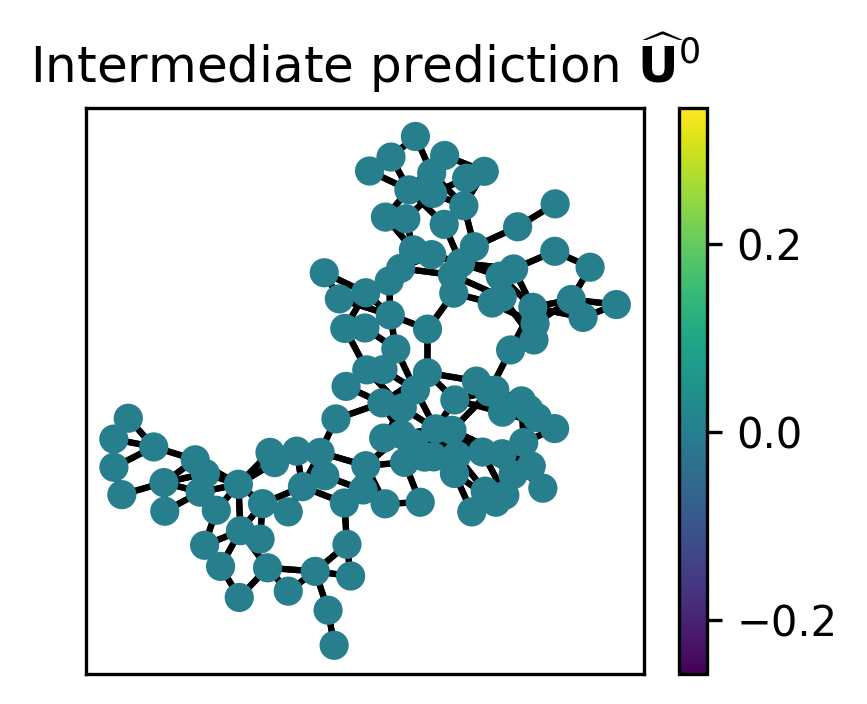

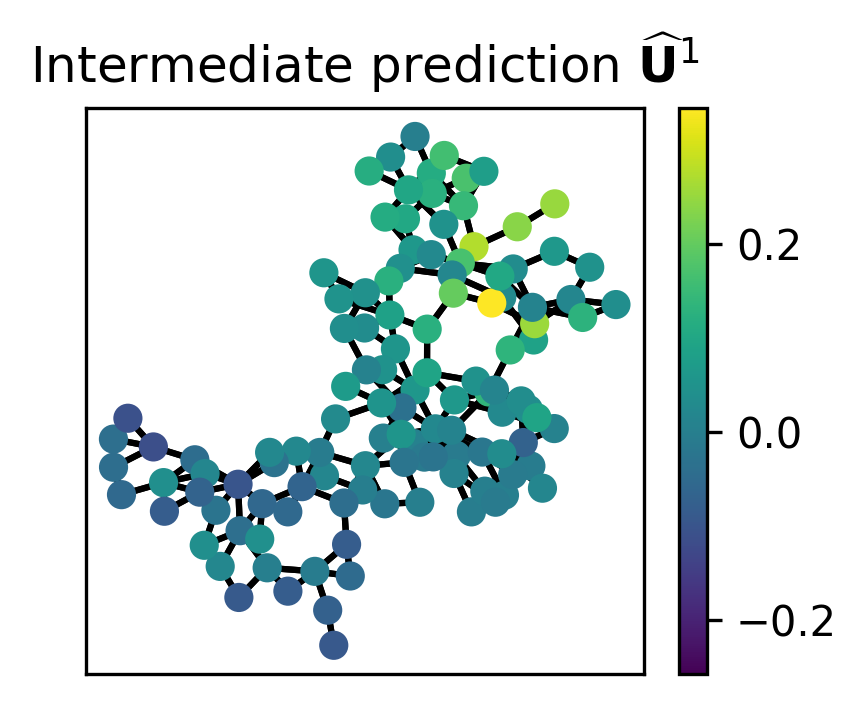

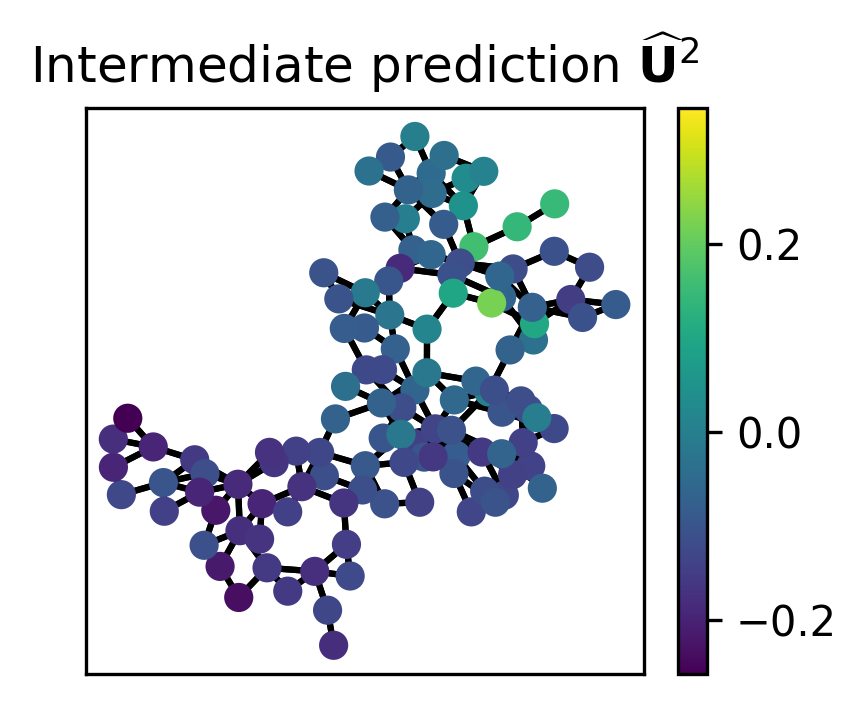

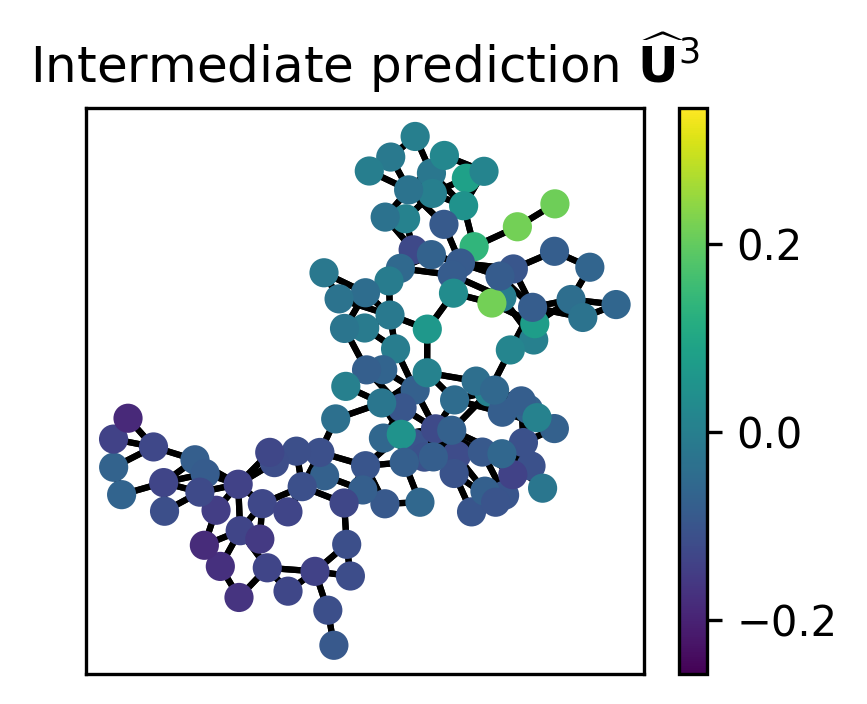

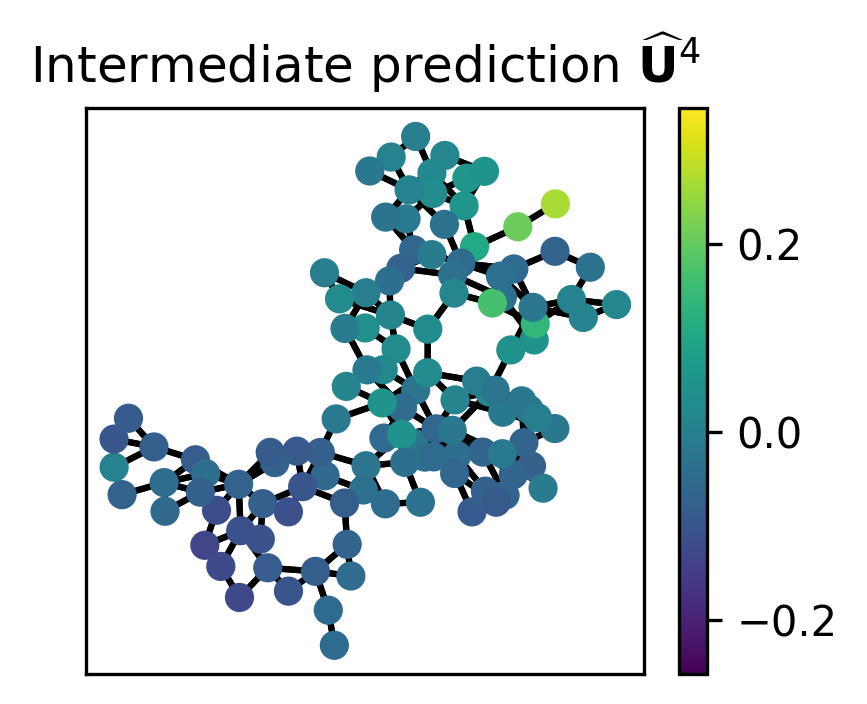

...

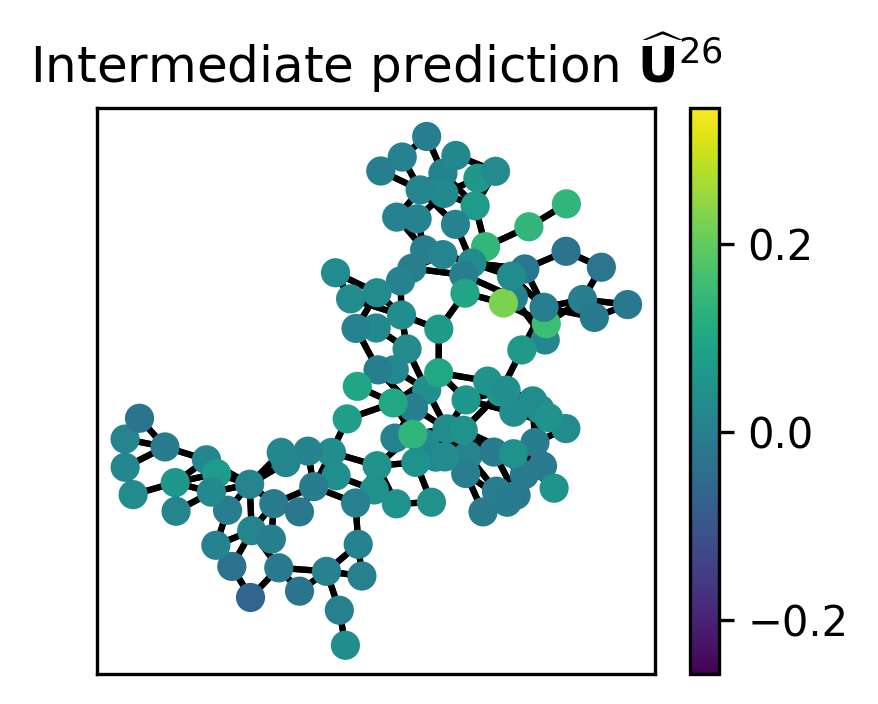

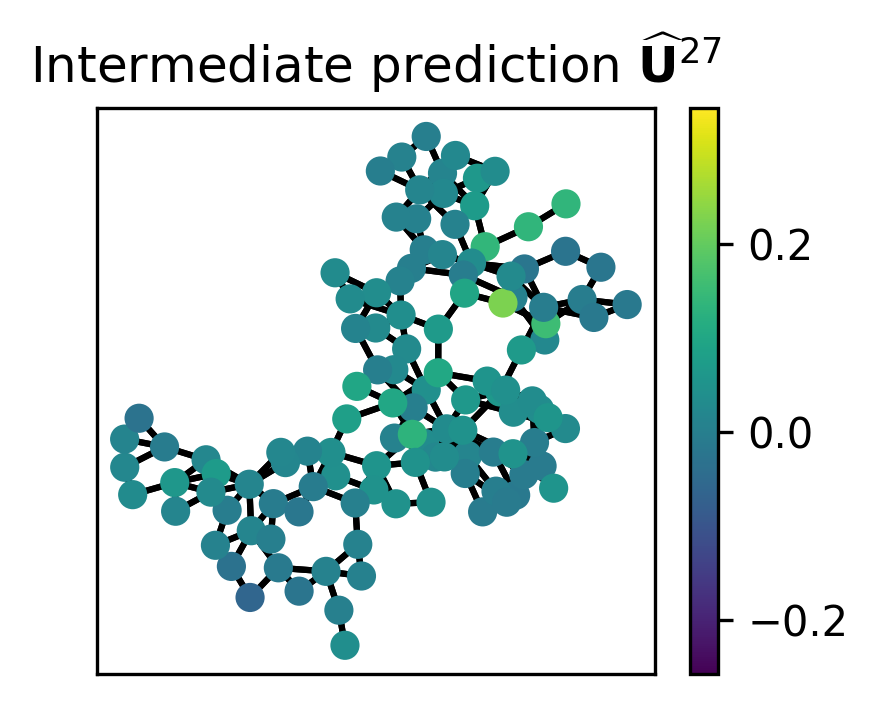

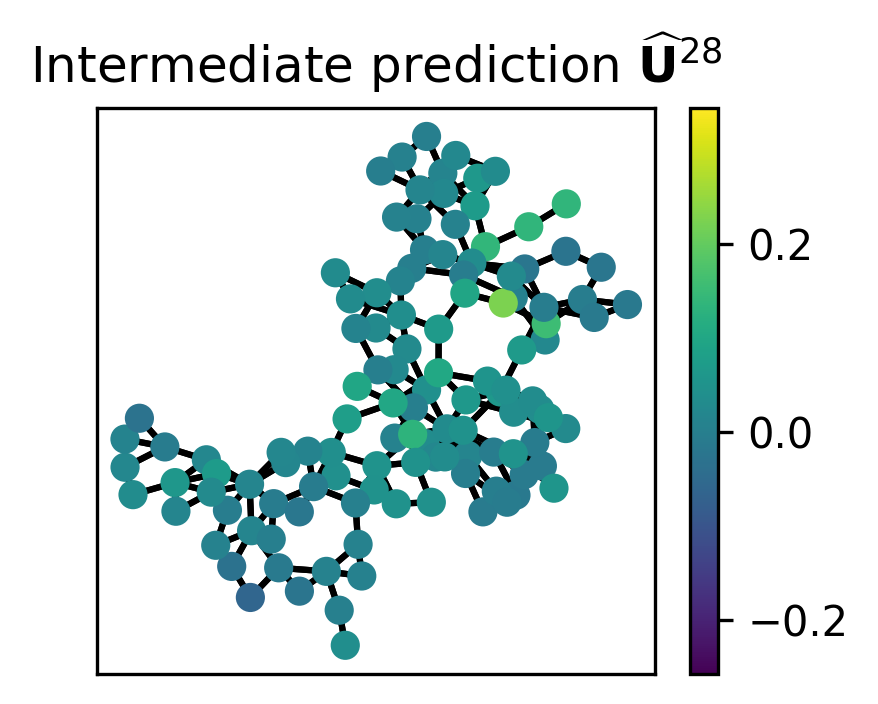

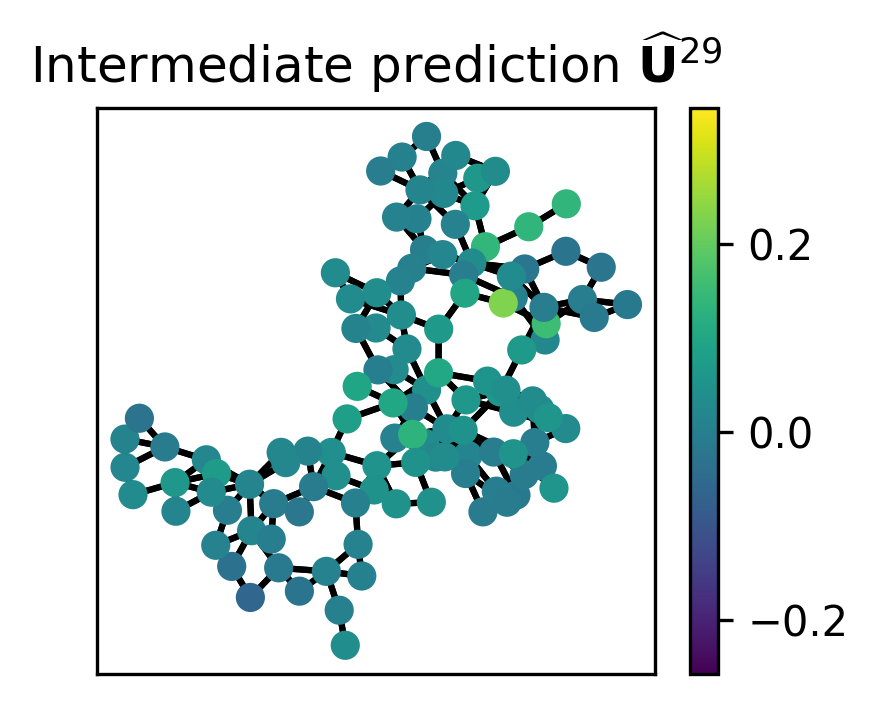

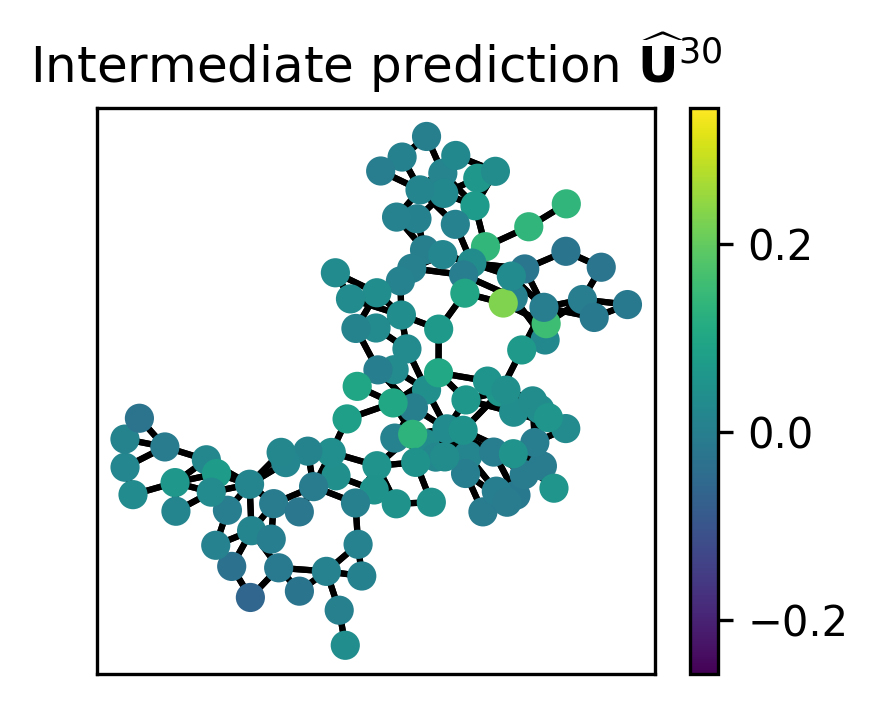

In [13]:
max_x = np.max(U[:,:,1]-U[:,0:1, 1])
min_x = np.min(U[:,:,1]-U[:,0:1, 1])

for frame in range(U.shape[0]):
    plt.figure(figsize=[3,2.5], dpi=300)
    
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.tick_params(
        axis='y',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelleft=False) # labels along the bottom edge are off
    plt.plot(coordinates_edge_x.T, coordinates_edge_y.T, 'k', zorder=1)
    plt.scatter(coordinates[:,0], coordinates[:,1], c=U[frame,:, 1]-U[frame,0, 1], zorder=2)
    plt.clim(min_x, max_x)
    plt.colorbar()
    plt.title(r'Intermediate prediction $\widehat{\mathbf{U}}^{'+str(frame)+'}$')
    plt.show()

## Latent variables evolution

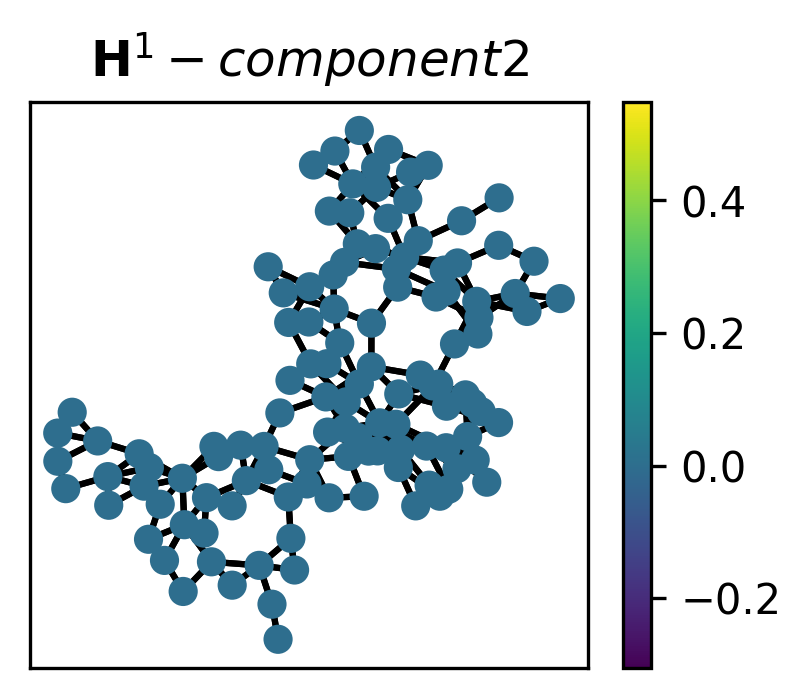

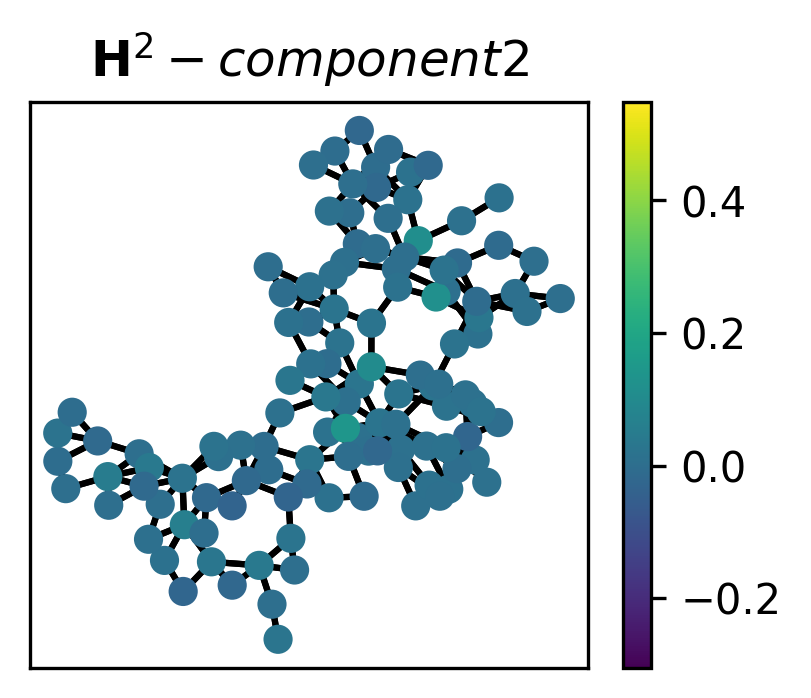

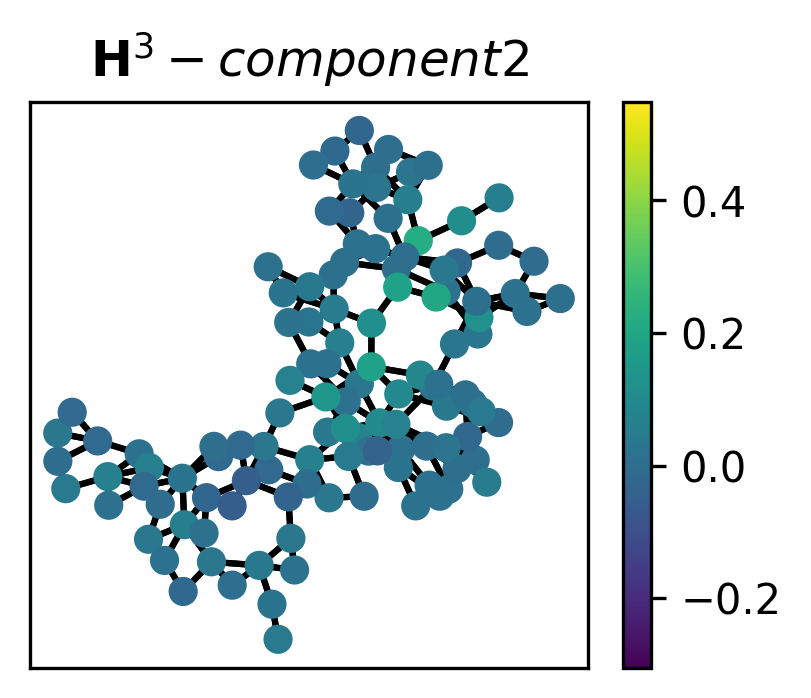

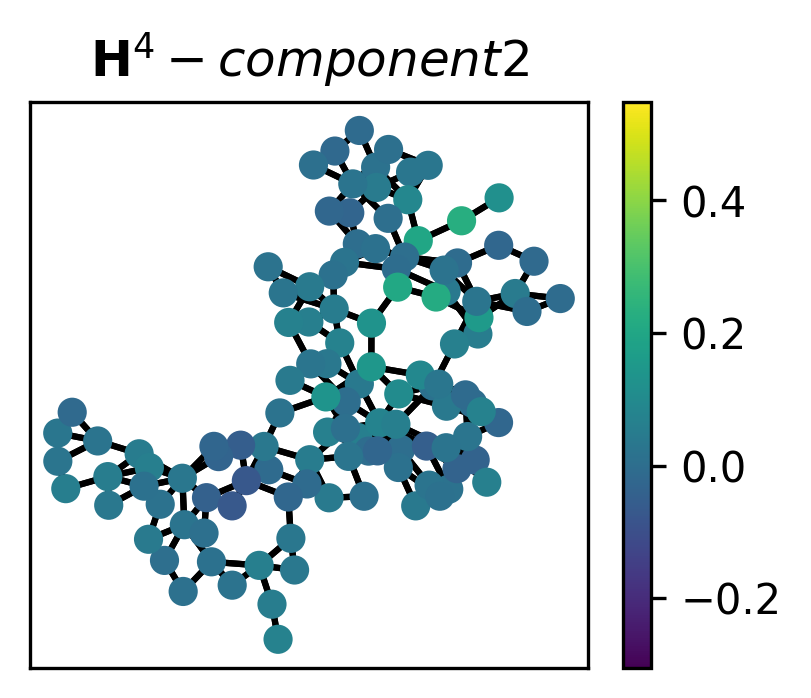

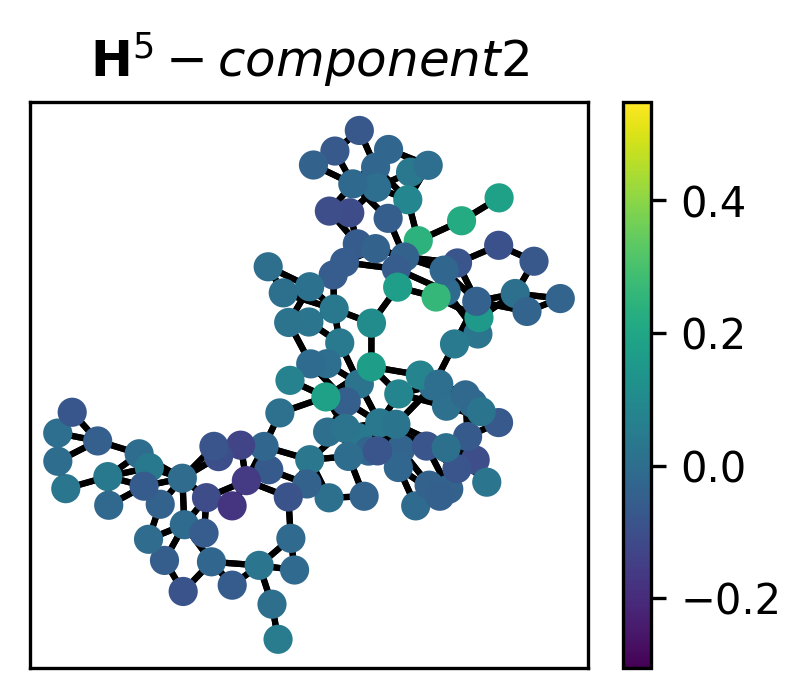

...

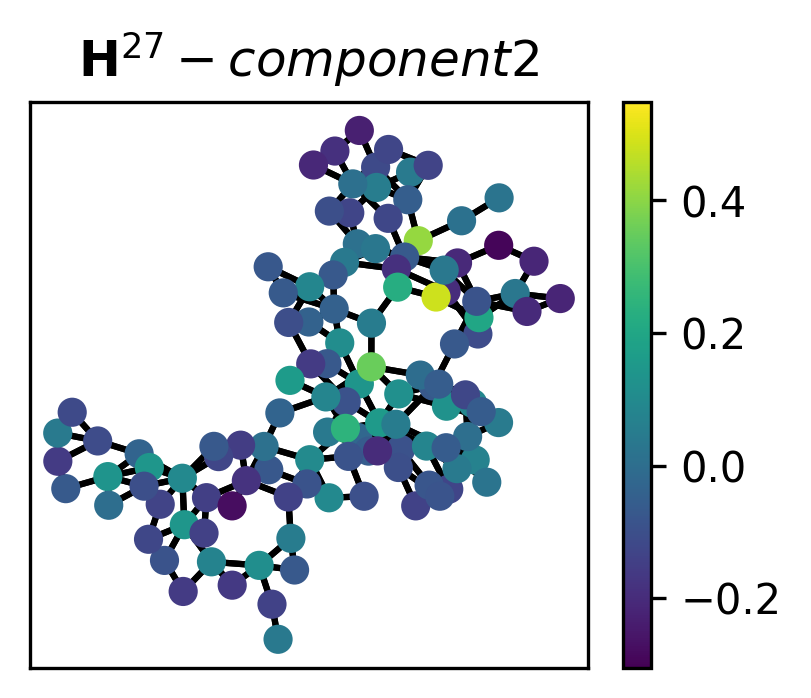

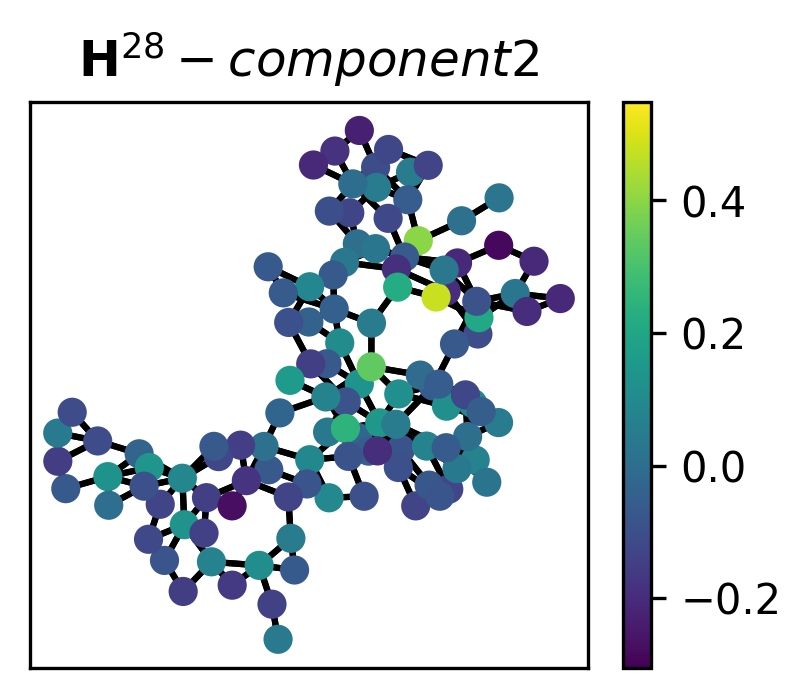

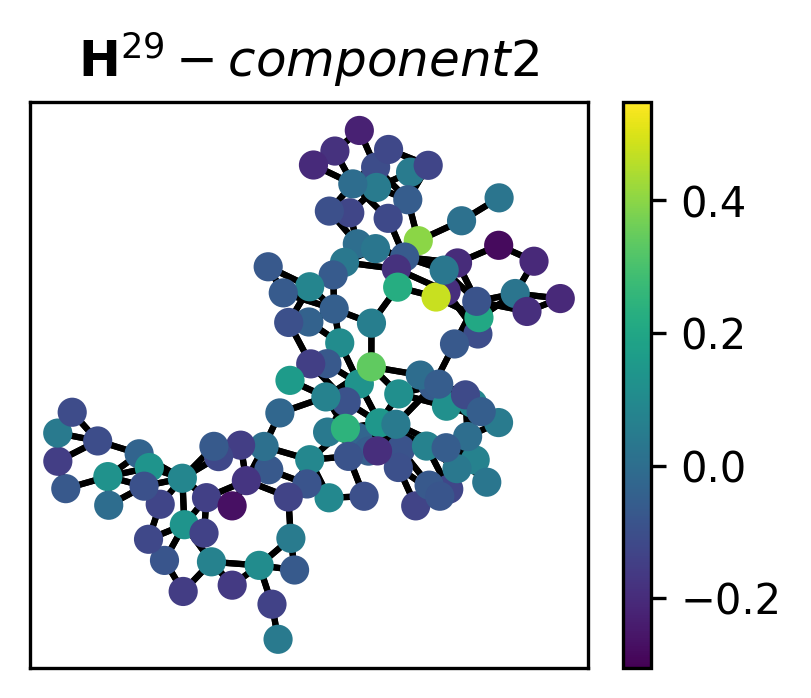

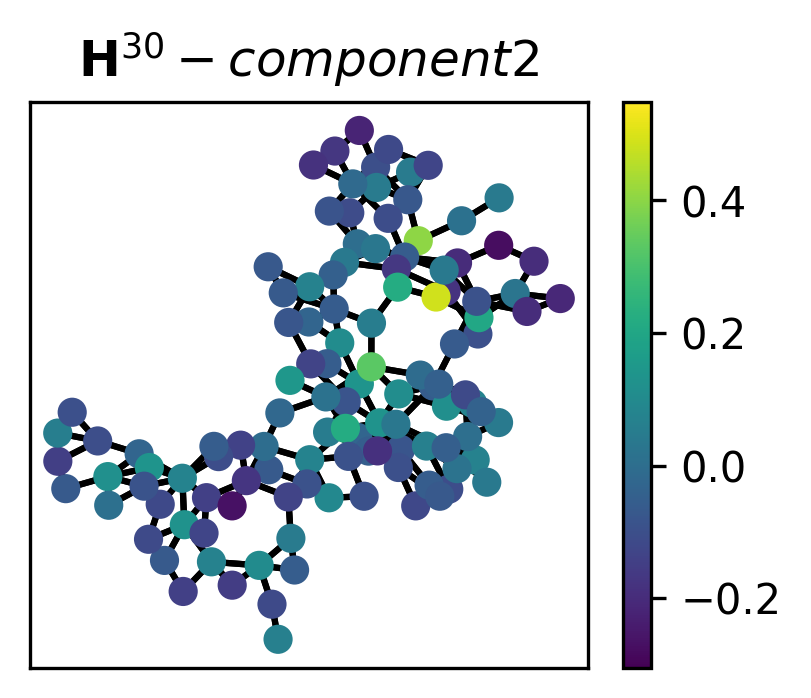

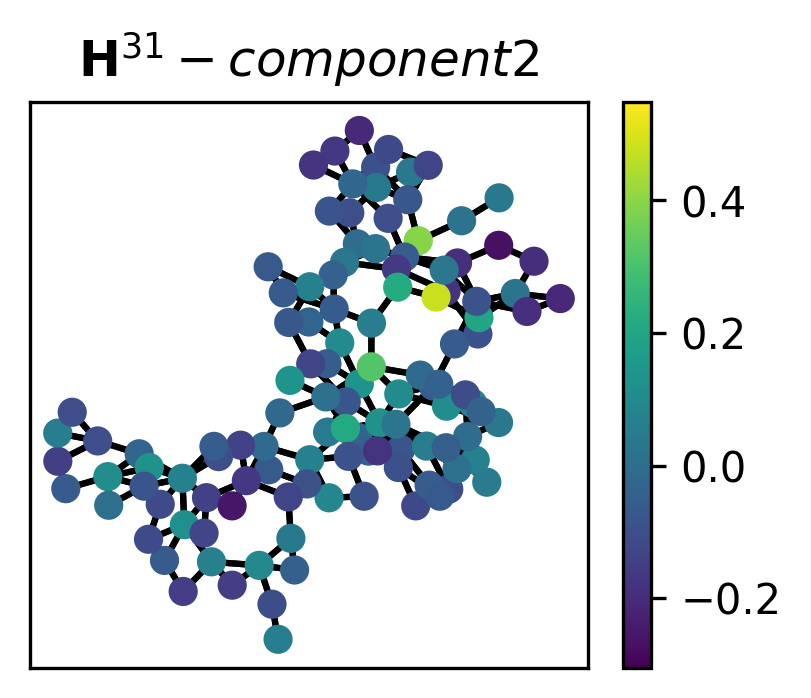

In [14]:
# Select which of the d components of H you want to visualize
component_of_H = 2

max_h = np.max(H[:,:,component_of_H])
min_h = np.min(H[:,:,component_of_H])

for frame in range(H.shape[0]):
    plt.figure(figsize=[3,2.5], dpi=300)
    
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.tick_params(
        axis='y',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelleft=False) # labels along the bottom edge are off
    
    plt.plot(coordinates_edge_x.T, coordinates_edge_y.T, 'k', zorder=1)
    plt.scatter(coordinates[:,0], coordinates[:,1], c=H[frame,:,component_of_H], zorder=2)
    plt.clim(min_h, max_h)
    plt.colorbar()
    plt.title(r'$\mathbf{H}^{'+str(frame+1)+'} - component {'+str(component_of_H)+'}$')
    plt.show()